# Reproducing JPM’s US Rates Strategy RV Trade Idea 
## Note - `Treasuries: Is this it?` (12 July 2024)
## `100:95 weighted 0.625% Jul-26s / 1.25% Dec-26s steepeners`

```
Turning to relative value, we see opportunities in the 2- to 2.5-year sector, where original-issue 5-year notes have recently cheapened relative to our par curve. In particular, we like fading the cheapening of 0.625% Jul-26s against 1.25% Dec-26s. As Figure 8 shows, this curve appears 4bp too flat relative to the shape of 2s/5s. Against this backdrop, we recommend 100:95 weighted 0.625% Jul-26s / 1.25% Dec-26s steepeners (see Trade recommendations)
```

```
Separately, last month we highlighted that the 2036-38 sector had cheapened significantly and had recommended fading the cheapening in 4.75% Feb-37s, against 4.5% Aug-39s, which were about to drop out of the US basket (see Treasuries, US Fixed Income Markets Weekly, 6/14/24). Since then, Feb-37s/Aug-39s curve has normalized somewhat relative to the shape of 10s/20s (Figure 9). Traditionally, we’d wait for further mean-reversion in this relationship, before taking profits. However, as Figure 10.Howevr, thlaionsp betwnhs curvehas wknedigfcantly shows, the relationship between these two curves has deteriorated materially in recent weeks; i.e. the shape of Feb-37/Aug39 is being driven by more idiosyncratic factors. Against this backdrop, we recommend unwinding this trade at a profit (see Trade recommendations).
```

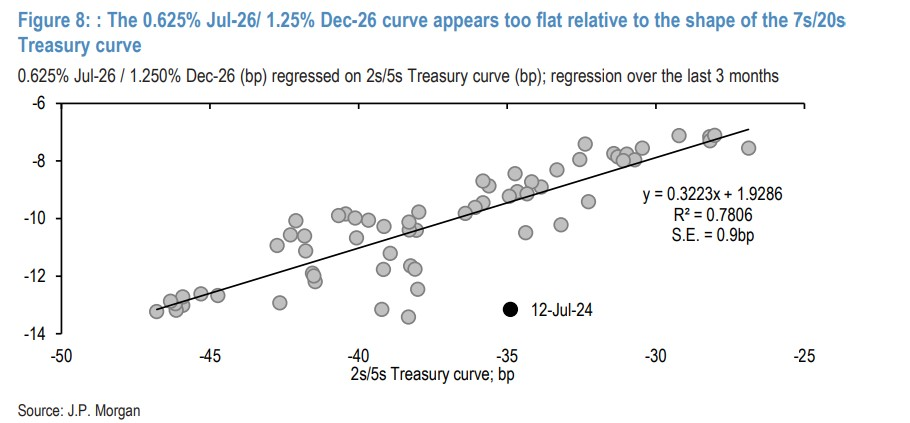

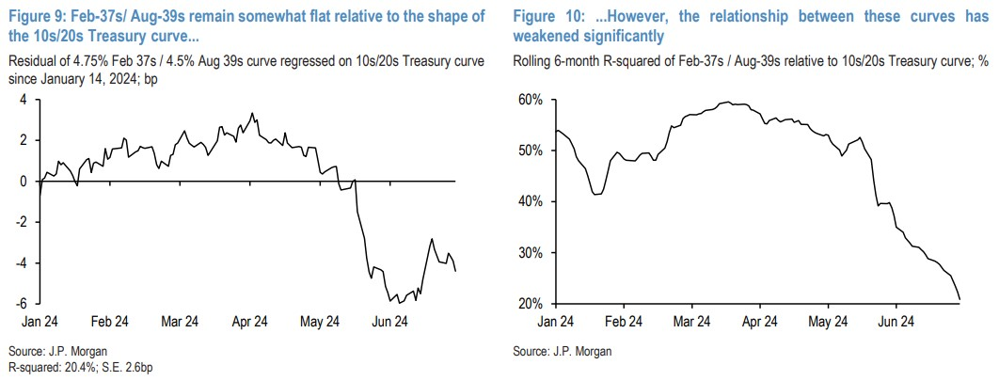

In [2]:
import sys
sys.path.append("../../")

In [115]:
from CurveInterpolator import GeneralCurveInterpolator
from CurveDataFetcher import CurveDataFetcher
from utils.rv_utils import cusip_spread_rv_regression
from utils.viz import plot_usts, run_rolling_regression_df
from models.calibrate import calibrate_mles_ols, calibrate_nss_ols
from models.NelsonSiegelSvensson import NelsonSiegelSvenssonCurve

In [6]:
import pandas as pd
import numpy as np
import scipy
from datetime import datetime
from typing import Dict, List
import tqdm

import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
params = {
    "axes.titlesize": "x-large",
    "legend.fontsize": "x-large",
    "axes.labelsize": "x-large",
    "xtick.labelsize": "x-large",
    "ytick.labelsize": "x-large",
}
pylab.rcParams.update(params)

import seaborn as sns
sns.set(style="whitegrid", palette="dark")

import nest_asyncio
nest_asyncio.apply()

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=pd.errors.SettingWithCopyWarning)
warnings.filterwarnings('ignore', category=RuntimeWarning)

import plotly
plotly.offline.init_notebook_mode()

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
curve_data_fetcher = CurveDataFetcher(use_ust_issue_date=True)

In [11]:
quote_type = "eod"
as_of_date = datetime(2024, 7, 12)

curve_set_df = curve_data_fetcher.build_curve_set(
    as_of_date=as_of_date,
    sorted=True,
    include_off_the_run_number=True,
    market_cols_to_return=[f"{quote_type}_price", f"{quote_type}_yield"],
    calc_free_float=True,
    use_github=True,
)

curve_set_df

,cusip,security_type,auction_date,issue_date,maturity_date,time_to_maturity,int_rate,high_investment_rate,is_on_the_run,ust_label,...,parValue,percentOutstanding,est_outstanding_amt,corpus_cusip,outstanding_amt,portion_unstripped_amt,portion_stripped_amt,reconstituted_amt,free_float,rank
0,912797KP1,Bill,2024-06-13,2024-06-18,2024-07-16,0.010959,NaN,5.355,False,5.355% Jul-24,...,5.989944e+08,0.002844,2.105814e+11,NaN,0.000000e+00,NaN,0.000000e+00,NaN,-598.9944,16.0
1,912797KQ9,Bill,2024-06-20,2024-06-25,2024-07-23,0.030137,NaN,5.324,False,5.324% Jul-24,...,6.528583e+08,0.003099,2.106357e+11,NaN,0.000000e+00,NaN,0.000000e+00,NaN,-652.8583,15.0
2,912797KR7,Bill,2024-06-27,2024-07-02,2024-07-30,0.049315,NaN,5.365,False,5.365% Jul-24,...,7.225868e+08,0.003429,2.107041e+11,NaN,0.000000e+00,NaN,0.000000e+00,NaN,-722.5868,14.0
3,912797KW6,Bill,2024-07-03,2024-07-09,2024-08-06,0.068493,NaN,5.375,True,5.375% Aug-24,...,7.354958e+08,0.003409,2.157435e+11,NaN,0.000000e+00,NaN,0.000000e+00,NaN,-735.4958,13.0
4,912797KX4,Bill,2024-06-13,2024-06-18,2024-08-13,0.087671,NaN,5.382,False,5.382% Aug-24,...,5.267986e+08,0.004036,1.305234e+11,NaN,0.000000e+00,NaN,0.000000e+00,NaN,-526.7986,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
387,912810TR9,Bond,2023-07-13,2023-07-17,2053-05-15,28.860274,3.625,NaN,False,3.625% May-53,...,5.723292e+09,0.091437,6.259307e+10,912803GS6,6.259307e+10,39689851.8,2.290322e+10,1283290.0,33966.5599,4.0
388,912810TT5,Bond,2023-10-12,2023-10-16,2053-08-15,29.112329,4.125,NaN,False,4.125% Aug-53,...,8.606596e+09,0.120247,7.157430e+10,912803GU1,7.157430e+10,61748876.0,9.825425e+09,108683.0,53142.2798,3.0
389,912810TV0,Bond,2024-01-11,2024-01-16,2053-11-15,29.364384,4.750,NaN,False,4.750% Nov-53,...,4.567153e+08,0.006874,6.644364e+10,912803GW7,6.644364e+10,58598705.9,7.844939e+09,1837270.0,58141.9906,2.0
390,912810TX6,Bond,2024-04-11,2024-04-15,2054-02-15,29.616438,4.250,NaN,False,4.250% Feb-54,...,2.211754e+09,0.031064,7.119879e+10,912803GY3,7.119879e+10,61136104.7,1.006269e+10,3279100.0,58924.3502,1.0


## Build Par Curve Model

In [12]:
def liquidity_premium_curve_set_filter(curve_set_df: pd.DataFrame):

    # remove OTRs, olds, double olds, triple olds
    curve_set_filtered_df = curve_set_df[
        (curve_set_df["rank"] != 0) & (curve_set_df["rank"] != 1) & (curve_set_df["rank"] != 2) & (curve_set_df["rank"] != 3)
    ]

    # remove TBills
    curve_set_filtered_df = curve_set_filtered_df[curve_set_filtered_df["security_type"] != "Bill"]

    # remove low free float bonds (< $5bn)
    curve_set_filtered_df = curve_set_filtered_df[curve_set_filtered_df["free_float"] > 5000]

    # filter out bonds very close to maturity
    curve_set_filtered_df = curve_set_filtered_df[curve_set_filtered_df["time_to_maturity"] > 30 / 360]

    # remove CTDs
    curve_set_filtered_df = curve_set_filtered_df[
        ~curve_set_filtered_df["cusip"].isin(
            [
                curve_data_fetcher.ust_data_fetcher.cme_ust_label_to_cusip("4.625s 2026-09-15")["cusip"],  # TU
                curve_data_fetcher.ust_data_fetcher.cme_ust_label_to_cusip("4.125s 2027-09-30")["cusip"],  # Z3N
                curve_data_fetcher.ust_data_fetcher.cme_ust_label_to_cusip("4.25s 2029-02-28")["cusip"],  # FV
                curve_data_fetcher.ust_data_fetcher.cme_ust_label_to_cusip("4.25s 2031-06-30")["cusip"],  # TY
                curve_data_fetcher.ust_data_fetcher.cme_ust_label_to_cusip("4.375s 2034-05-15")["cusip"],  # TN
                curve_data_fetcher.ust_data_fetcher.cme_ust_label_to_cusip("4.625s 2040-02-15")["cusip"],  # US
                curve_data_fetcher.ust_data_fetcher.cme_ust_label_to_cusip("4.5s 2044-02-15")["cusip"],  # TWE
                curve_data_fetcher.ust_data_fetcher.cme_ust_label_to_cusip("4.75s 2053-11-15")["cusip"],  # UL
            ]
        )
    ]

    curve_set_filtered_df = curve_set_filtered_df.sort_values(by=["time_to_maturity"])

    return curve_set_filtered_df


def no_filter(curve_set_df: pd.DataFrame):
    return curve_set_df

In [17]:
# filter and fit bspline w/ knots are liquidity points
curve_set_filtered_df = liquidity_premium_curve_set_filter(curve_set_df=curve_set_df)

filtered_fitted_interpolator = GeneralCurveInterpolator(
    x=curve_set_filtered_df["time_to_maturity"].to_numpy(),
    y=curve_set_filtered_df[f"{quote_type}_yield"].to_numpy(),
)

fitted_bspline = filtered_fitted_interpolator.b_spline_with_knots_interpolation(
    knots=[0.5, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 15, 20, 25],
    k=3,
    return_func=True,
)

nss_func, status_nss, _ = calibrate_nss_ols(
    curve_set_filtered_df["time_to_maturity"].to_numpy(),
    curve_set_filtered_df[f"{quote_type}_yield"].to_numpy(),
)
assert status_nss

mles_func, status_mles = calibrate_mles_ols(
    curve_set_filtered_df["time_to_maturity"].to_numpy(),
    curve_set_filtered_df[f"{quote_type}_yield"].to_numpy(),
    overnight_rate=5.31,
    N=9,
)

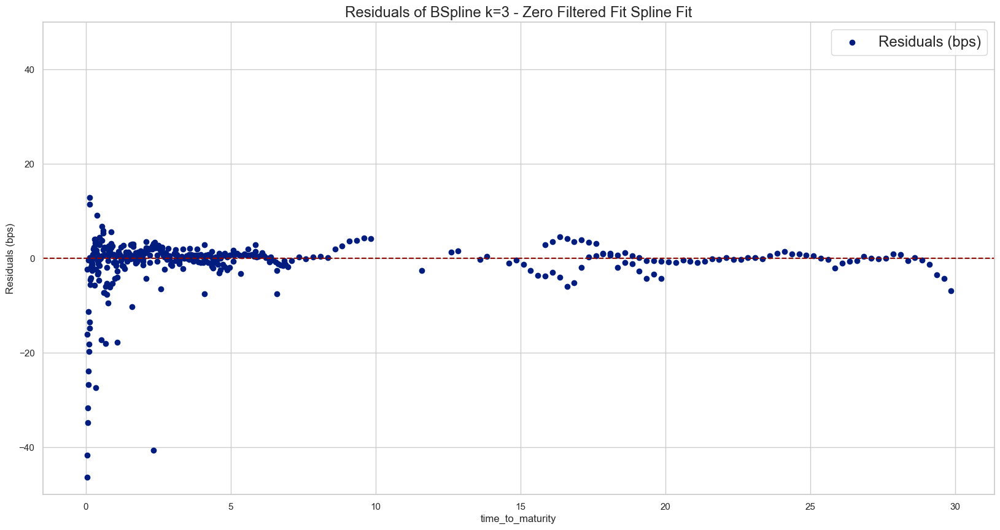

In [25]:
plot_usts(
    curve_set_df=curve_set_df,
    ttm_col="time_to_maturity",
    ytm_col=f"{quote_type}_yield",
    hover_data=[
        "issue_date",
        "maturity_date",
        "cusip",
        "original_security_term",
        "ust_label",
        f"{quote_type}_price",
        "free_float",
    ],
    ust_labels_highlighter=[
        ("0.625% Jul-26", "red"), ("1.250% Dec-26", "blue"), 
    ],
    zero_curves=[(fitted_bspline, "BSpline k=3 - Zero Filtered Fit"), (nss_func, "Nelson Siegel Svensson"), (mles_func, "Merrill Lynch Exponential Spline")],
    title=f"All USTs - using {f"{quote_type}_yield"} - as of {as_of_date}",
    y_axis_range=[4.0, 5.5]
)

## Fetching historical curve sets to regress 0.625% Jul-26s / 1.25% Dec-26s vs our fitted model over time

In [26]:
start_date = datetime(2024, 4, 1)
end_date = datetime(2024, 7, 12)

curve_sets_dict_df, fitted_curves_dict = curve_data_fetcher.fetch_historical_curve_sets(
    start_date=start_date,
    end_date=end_date,
    fetch_soma_holdings=True,
    fetch_stripping_data=True,
    calc_free_float=True,
    fitted_curves=[
        ("LPF", f"{quote_type}_yield", liquidity_premium_curve_set_filter),
    ],
)

AGGREGATING CURVE SET DFs: 100%|██████████| 94/94 [00:02<00:00, 36.61it/s]


In [28]:
cusip_timeseries: Dict[str, List[Dict[str, str | float | int]]] = {}
fitted_cubic_spline_timeseries: Dict[datetime, scipy.interpolate] = {}
fitted_bspline_timeseries: Dict[datetime, scipy.interpolate] = {}
fitted_smooth_spline_timeseries: Dict[datetime, scipy.interpolate] = {}

for dt in tqdm.tqdm(curve_sets_dict_df.keys(), desc="Main Loop"):
    fitted_cubic_spline = fitted_curves_dict[dt]["LPF"].b_spline_with_knots_interpolation(
        knots=[0.5, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 15, 20, 25],
        k=3,
        return_func=True,
    )
    fitted_bspline = fitted_curves_dict[dt]["LPF"].b_spline_with_knots_interpolation(
        knots=[0.5, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 15, 20, 25], k=5, return_func=True
    )
    fitted_smooth_spline = fitted_curves_dict[dt]["LPF"].b_spline_with_knots_interpolation(
        knots=[0.5, 1, 2, 3, 5, 7, 10, 20], k=4, return_func=True
    )

    fitted_cubic_spline_timeseries[dt] = fitted_cubic_spline
    fitted_bspline_timeseries[dt] = fitted_bspline
    fitted_smooth_spline_timeseries[dt] = fitted_smooth_spline 

    curr_curve_set_df = curve_sets_dict_df[dt]
    curr_curve_set_df["lpf_cubic_spline_spread"] = curr_curve_set_df["eod_yield"] - fitted_cubic_spline(curr_curve_set_df["time_to_maturity"])
    curr_curve_set_df["lpf_bspline_spread"] = curr_curve_set_df["eod_yield"] - fitted_bspline(curr_curve_set_df["time_to_maturity"])
    curr_curve_set_df["lpf_smooth_spline_spread"] = curr_curve_set_df["eod_yield"] - fitted_smooth_spline(curr_curve_set_df["time_to_maturity"])

    for _, row in curr_curve_set_df.iterrows():
        if row["cusip"] not in cusip_timeseries:
            cusip_timeseries[row["cusip"]] = []

        payload = {
            "Date": dt,
            "cusip": row["cusip"],
            f"{quote_type}_yield": row[f"{quote_type}_yield"],
            f"{quote_type}_price": row[f"{quote_type}_price"],
            "lpf_cubic_spline_spread": row["lpf_cubic_spline_spread"],
            "lpf_bspline_spread": row["lpf_bspline_spread"],
            "lpf_smooth_spline_spread": row["lpf_smooth_spline_spread"],
            "free_float": row["free_float"],
            "est_outstanding_amount": row["est_outstanding_amt"],
            "soma_holdings": row["parValue"],
            "soma_holdings_percent_outstanding": row["percentOutstanding"],
            "stripped_amount": row["portion_stripped_amt"],
            "reconstituted_amount": row["reconstituted_amt"],
            "lpf_cubic_spline": fitted_cubic_spline,
            "lpf_bspline": fitted_bspline,
            "lpf_smooth_spline": fitted_smooth_spline,
        }
        
        cusip_timeseries[row["cusip"]].append(payload)

Main Loop: 100%|██████████| 72/72 [00:01<00:00, 42.67it/s]


In [29]:
ct_yields_df = curve_data_fetcher.fedinvest_data_fetcher.get_historical_ct_yields(start_date=start_date, end_date=end_date)
ct_yields_df

,Date,CT2M,CT3M,CT6M,CT1,CT2,CT3,CT5,CT7,CT10,CT20,CT30
0,2024-04-01,NaN,5.382196,5.393189,5.078389,4.715645,4.511302,4.335726,4.334039,4.324568,4.576638,4.468567
1,2024-04-02,NaN,5.374033,5.382022,5.067000,4.699117,4.511451,4.349917,4.365707,4.360544,4.615595,4.505884
2,2024-04-03,NaN,5.384197,5.370860,5.044716,4.682556,4.488627,4.335827,4.355191,4.352618,4.615593,4.509835
3,2024-04-04,NaN,5.373238,5.348941,5.022444,4.649279,4.465782,4.300537,4.307803,4.308815,4.574195,4.468574
4,2024-04-05,NaN,5.382595,5.369280,5.064586,4.733240,4.546828,4.378591,4.392378,4.388936,4.647449,4.541568
...,...,...,...,...,...,...,...,...,...,...,...,...
67,2024-07-08,NaN,5.412165,5.339352,5.019376,4.623836,4.405211,4.228497,4.228815,4.271883,4.566545,4.458725
68,2024-07-09,NaN,5.433883,5.349724,5.040739,4.623696,4.404947,4.242501,4.249656,4.295275,4.592975,4.488691
69,2024-07-10,NaN,5.433481,5.349334,5.029463,4.623557,4.404683,4.242449,4.244394,4.279618,4.576118,4.471789
70,2024-07-11,NaN,5.401046,5.254785,4.909030,4.506034,4.278732,4.130070,4.145396,4.197901,4.504451,4.406717


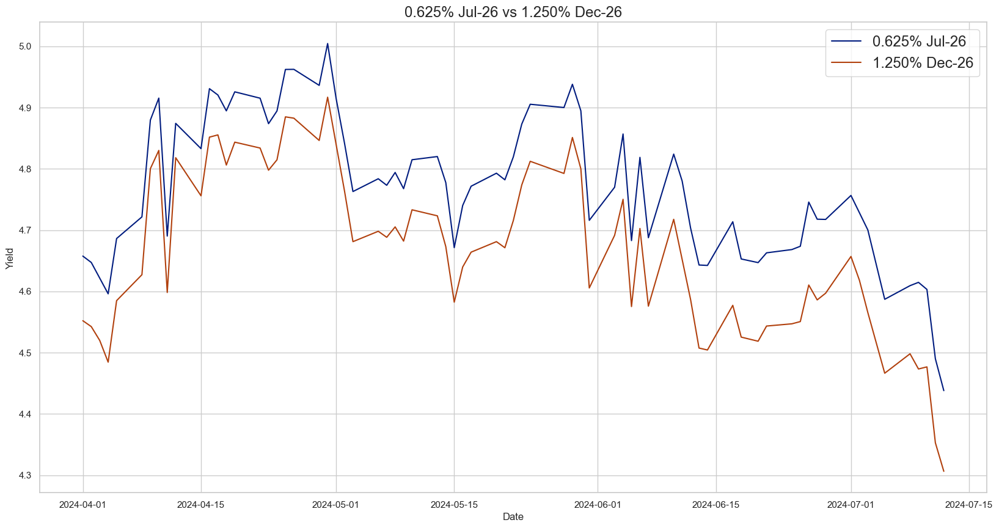

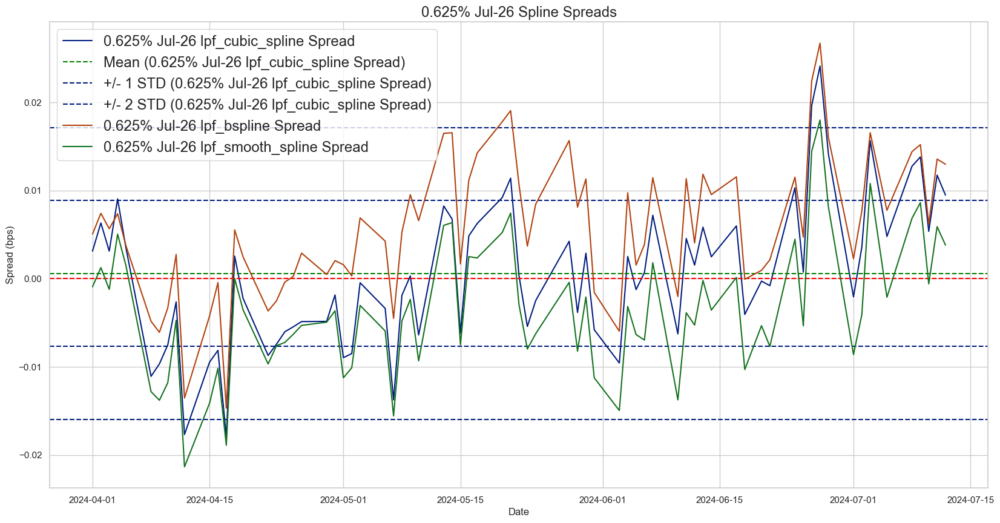

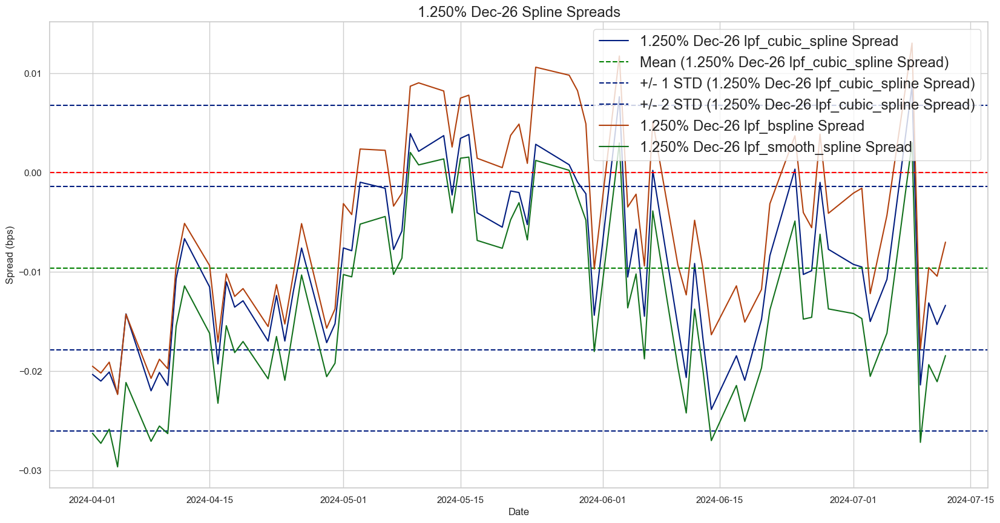

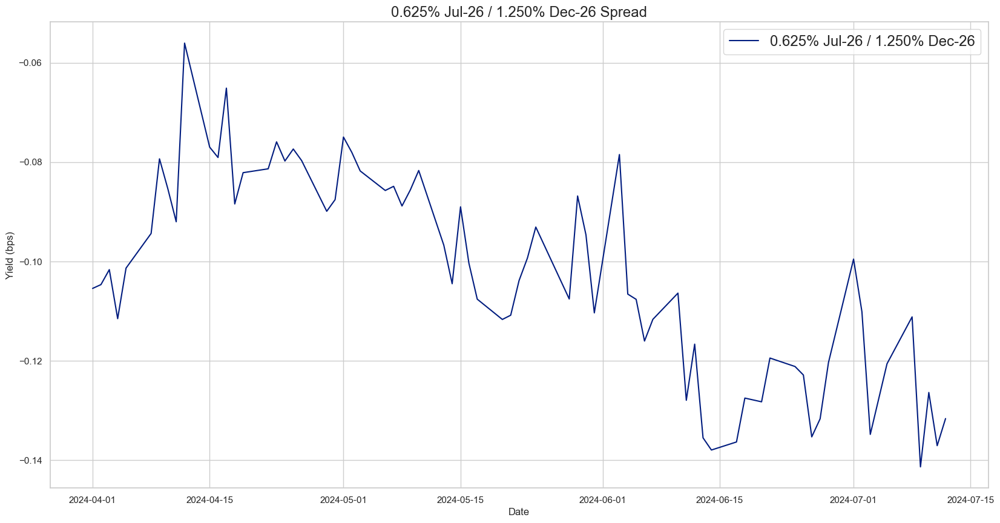

lpf_cubic_spline is Benchmark Spline


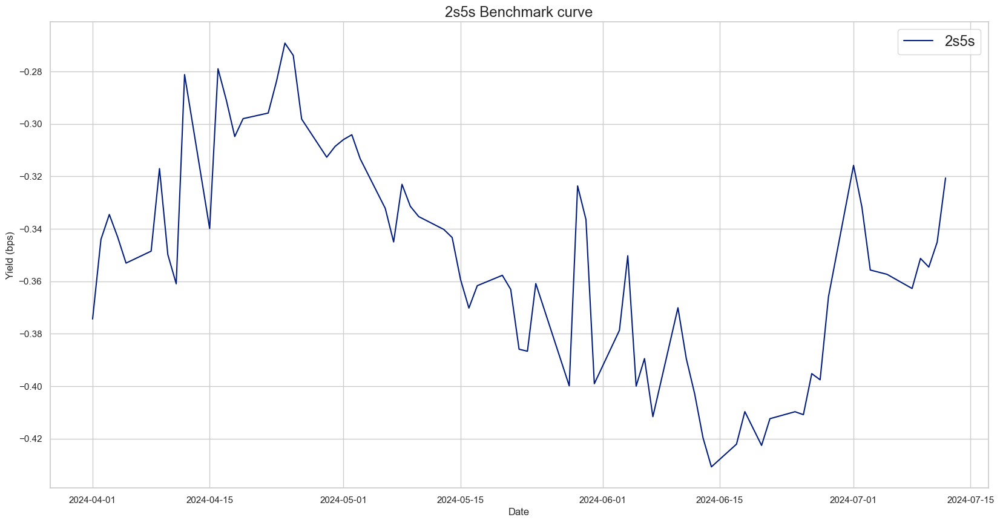

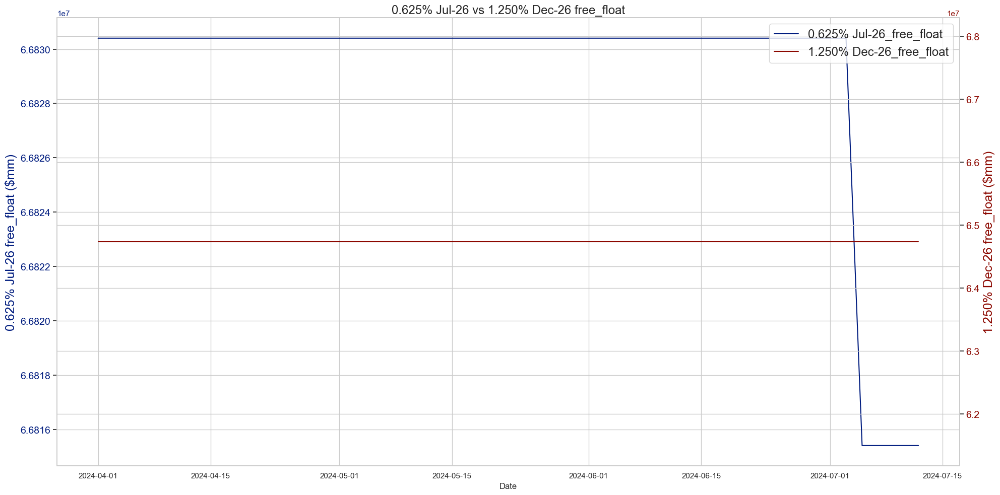

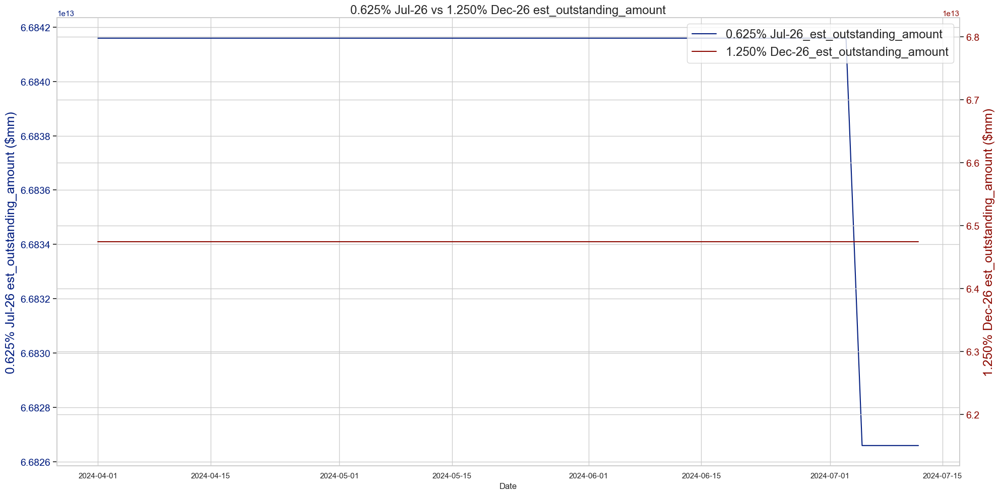

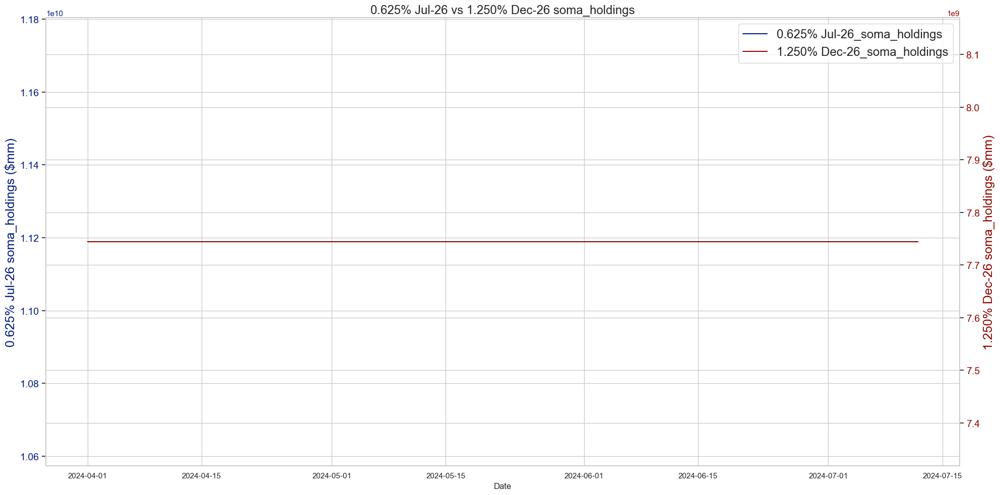

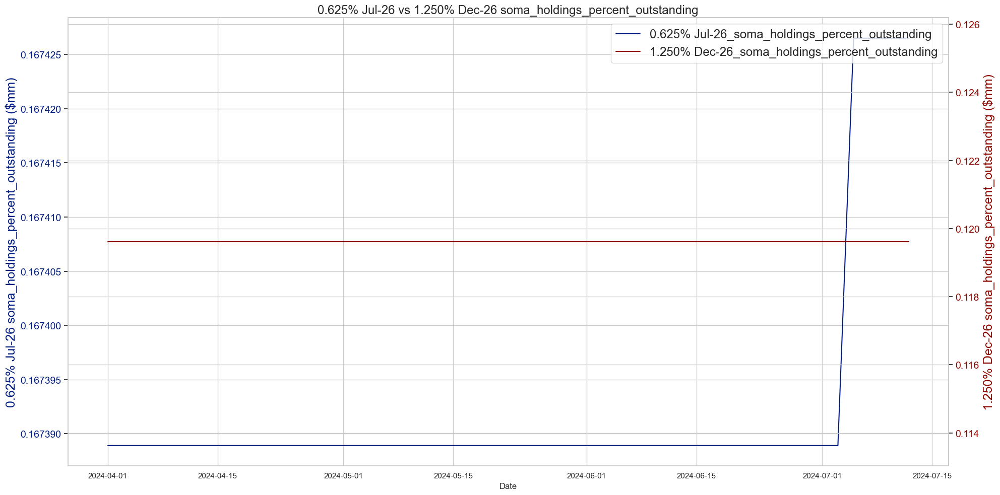

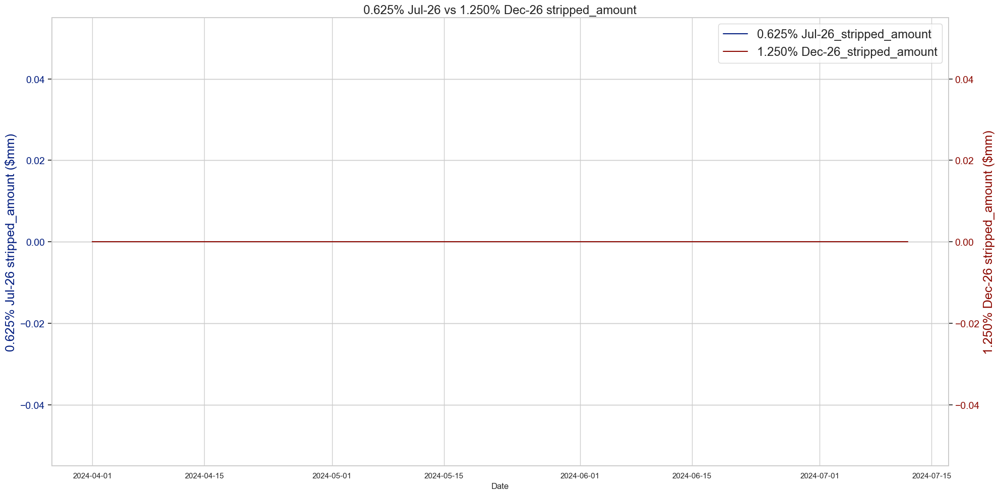

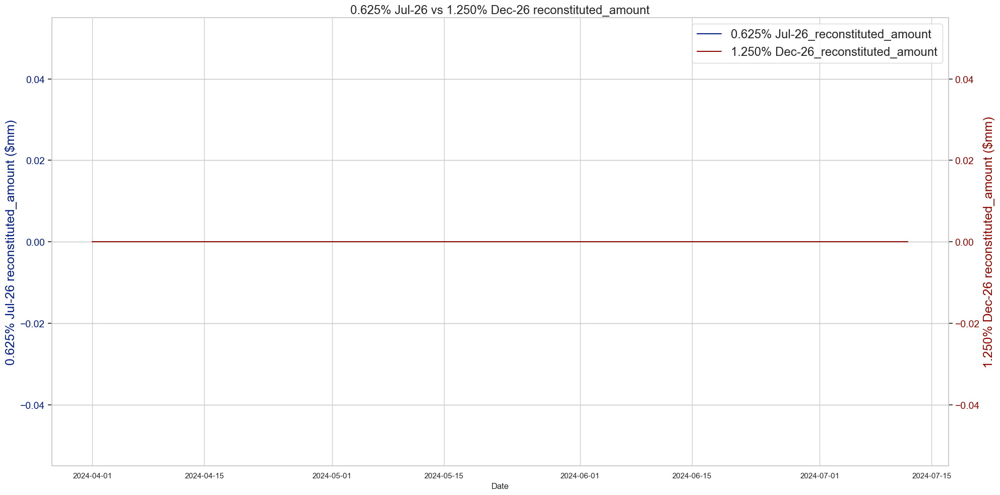

                                  OLS Regression Results                                 
Dep. Variable:     0.625% Jul-26 / 1.250% Dec-26   R-squared:                       0.547
Model:                                       OLS   Adj. R-squared:                  0.541
Method:                            Least Squares   F-statistic:                     84.65
Date:                           Sun, 06 Oct 2024   Prob (F-statistic):           1.14e-13
Time:                                   19:20:31   Log-Likelihood:                 207.35
No. Observations:                             72   AIC:                            -410.7
Df Residuals:                                 70   BIC:                            -406.1
Df Model:                                      1                                         
Covariance Type:                       nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
----------

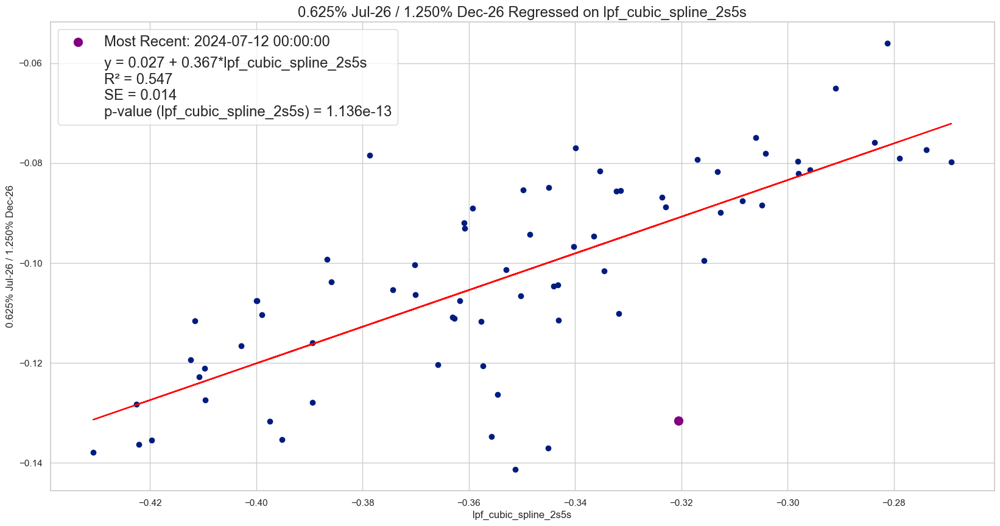

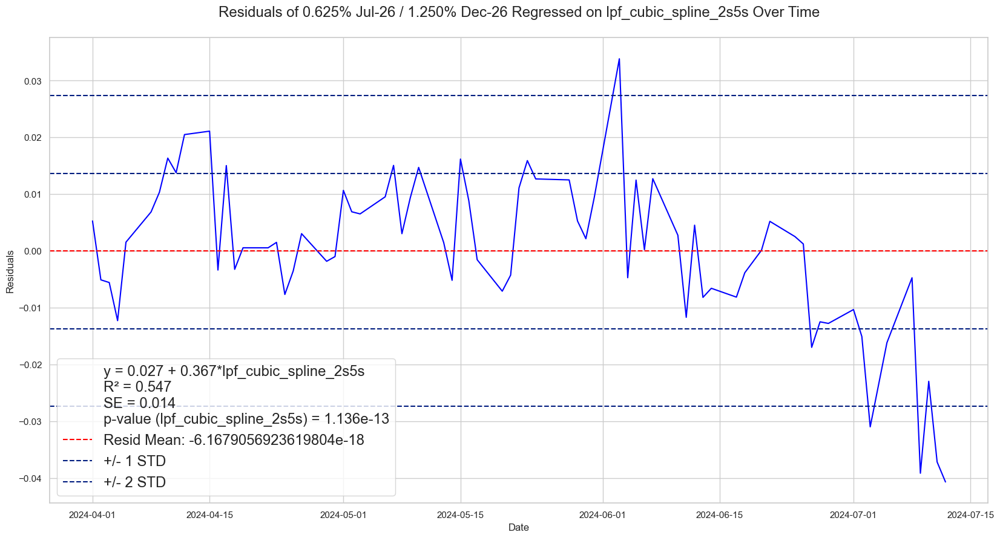

                                  OLS Regression Results                                 
Dep. Variable:     0.625% Jul-26 / 1.250% Dec-26   R-squared:                       0.616
Model:                                       OLS   Adj. R-squared:                  0.611
Method:                            Least Squares   F-statistic:                     112.3
Date:                           Sun, 06 Oct 2024   Prob (F-statistic):           3.38e-16
Time:                                   19:20:32   Log-Likelihood:                 213.28
No. Observations:                             72   AIC:                            -422.6
Df Residuals:                                 70   BIC:                            -418.0
Df Model:                                      1                                         
Covariance Type:                       nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------

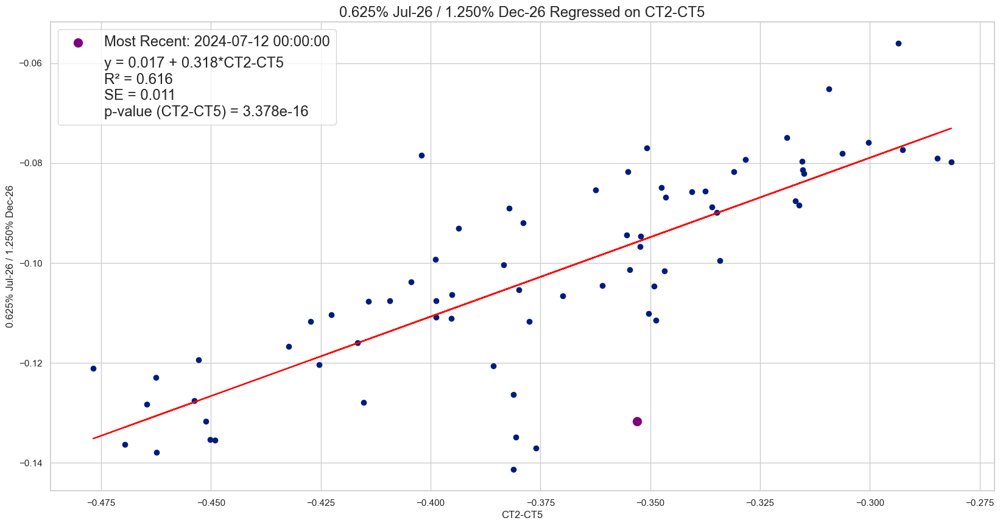

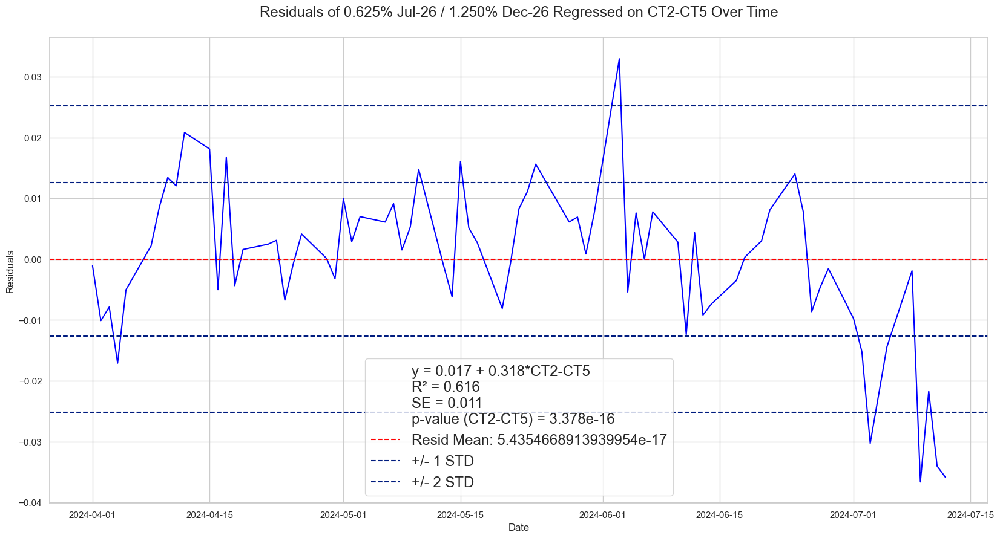

Using lpf_cubic_spline for UST Metrics Calcs


0.625% Jul-26 Metrics Calc: 72it [00:01, 36.30it/s]
1.250% Dec-26 Metrics Calc: 72it [00:01, 37.27it/s]


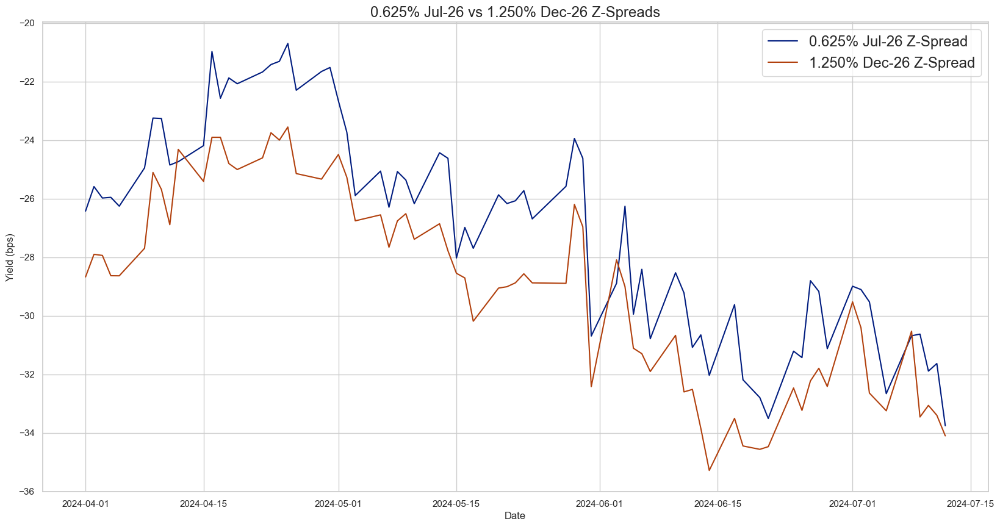

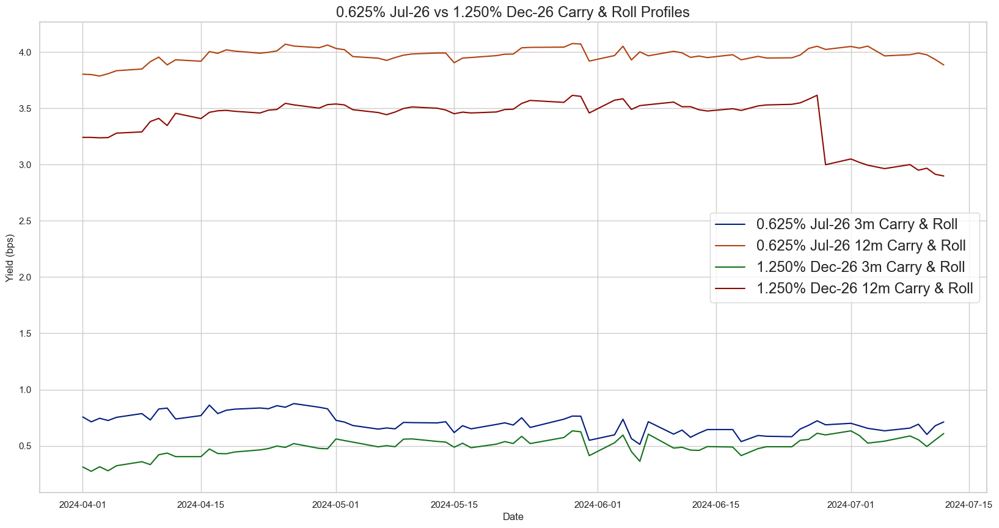

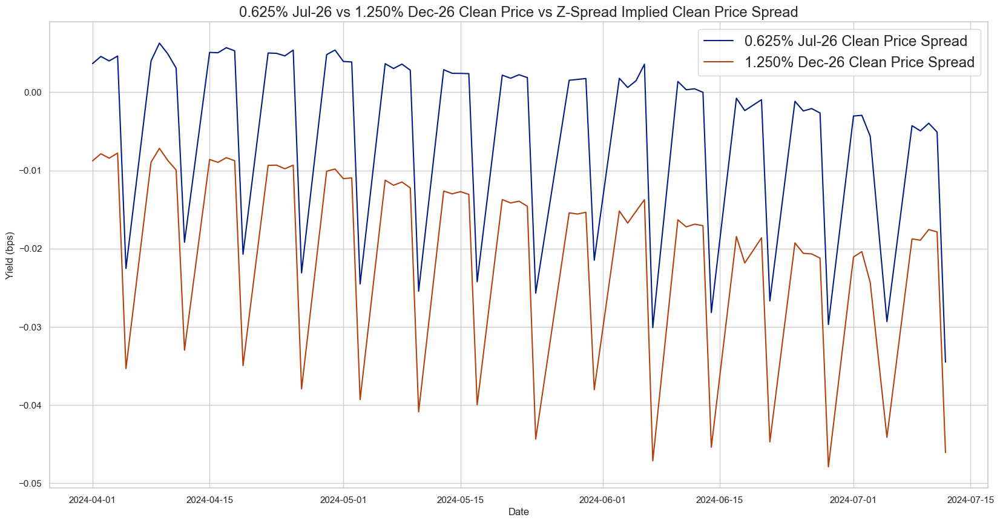

In [30]:
label1 = "0.625% Jul-26" 
label2 = "1.250% Dec-26" 

cusip_spread_rv_regression(
    curve_data_fetcher=curve_data_fetcher,
    label1=label1,
    label2=label2,
    cusip_timeseries=cusip_timeseries,
    fitted_splines_timeseries_dict={
        "lpf_cubic_spline": fitted_cubic_spline_timeseries,
        "lpf_bspline": fitted_bspline_timeseries,
        "lpf_smooth_spline": fitted_smooth_spline_timeseries,
    },
    benchmark_tenor_1=2,
    benchmark_tenor_2=5,
    ct_yields_df=ct_yields_df 
)

## Revisting `100:98 weighted 4.75% Feb 37s / 4.5% Aug 39s steepeners`

In [113]:
start_date = datetime(2023, 6, 1)
end_date = datetime(2024, 7, 12)

curve_sets_dict_df, fitted_curves_dict = curve_data_fetcher.fetch_historical_curve_sets(
    start_date=start_date,
    end_date=end_date,
    fetch_soma_holdings=True,
    fetch_stripping_data=True,
    calc_free_float=True,
    fitted_curves=[
        ("LPF", f"{quote_type}_yield", liquidity_premium_curve_set_filter),
    ],
)

cusip_timeseries: Dict[str, List[Dict[str, str | float | int]]] = {}
fitted_cubic_spline_timeseries: Dict[datetime, scipy.interpolate] = {}
fitted_bspline_timeseries: Dict[datetime, scipy.interpolate] = {}
fitted_smooth_spline_timeseries: Dict[datetime, scipy.interpolate] = {}

for dt in tqdm.tqdm(curve_sets_dict_df.keys(), desc="Main Loop"):
    fitted_cubic_spline = fitted_curves_dict[dt]["LPF"].b_spline_with_knots_interpolation(
        knots=[0.5, 1, 2, 3, 4, 5, 7, 10, 15, 20, 25],
        k=3,
        return_func=True,
    )
    fitted_bspline = fitted_curves_dict[dt]["LPF"].b_spline_with_knots_interpolation(
        knots=[0.5, 1, 2, 3, 4, 5, 7, 10, 15, 20, 25], k=5, return_func=True
    )
    fitted_smooth_spline = fitted_curves_dict[dt]["LPF"].b_spline_with_knots_interpolation(
        knots=[0.5, 1, 2, 3, 5, 7, 10, 20], k=4, return_func=True
    )

    fitted_cubic_spline_timeseries[dt] = fitted_cubic_spline
    fitted_bspline_timeseries[dt] = fitted_bspline
    fitted_smooth_spline_timeseries[dt] = fitted_smooth_spline 

    curr_curve_set_df = curve_sets_dict_df[dt]
    curr_curve_set_df["lpf_cubic_spline_spread"] = curr_curve_set_df["eod_yield"] - fitted_cubic_spline(curr_curve_set_df["time_to_maturity"])
    curr_curve_set_df["lpf_bspline_spread"] = curr_curve_set_df["eod_yield"] - fitted_bspline(curr_curve_set_df["time_to_maturity"])
    curr_curve_set_df["lpf_smooth_spline_spread"] = curr_curve_set_df["eod_yield"] - fitted_smooth_spline(curr_curve_set_df["time_to_maturity"])

    for _, row in curr_curve_set_df.iterrows():
        if row["cusip"] not in cusip_timeseries:
            cusip_timeseries[row["cusip"]] = []

        payload = {
            "Date": dt,
            "cusip": row["cusip"],
            f"{quote_type}_yield": row[f"{quote_type}_yield"],
            f"{quote_type}_price": row[f"{quote_type}_price"],
            "lpf_cubic_spline_spread": row["lpf_cubic_spline_spread"],
            "lpf_bspline_spread": row["lpf_bspline_spread"],
            "lpf_smooth_spline_spread": row["lpf_smooth_spline_spread"],
            "free_float": row["free_float"],
            "est_outstanding_amount": row["est_outstanding_amt"],
            "soma_holdings": row["parValue"],
            "soma_holdings_percent_outstanding": row["percentOutstanding"],
            "stripped_amount": row["portion_stripped_amt"],
            "reconstituted_amount": row["reconstituted_amt"],
            "lpf_cubic_spline": fitted_cubic_spline,
            "lpf_bspline": fitted_bspline,
            "lpf_smooth_spline": fitted_smooth_spline,
        }
        
        cusip_timeseries[row["cusip"]].append(payload)
        

ct_yields_df = curve_data_fetcher.fedinvest_data_fetcher.get_historical_ct_yields(start_date=start_date, end_date=end_date)
ct_yields_df

Main Loop: 100%|██████████| 277/277 [00:07<00:00, 37.66it/s]


,Date,CT2M,CT3M,CT6M,CT1,CT2,CT3,CT5,CT7,CT10,CT20,CT30
0,2023-06-01,NaN,5.454437,5.446241,5.135337,4.332358,3.986357,3.700936,3.658065,3.608150,3.984667,3.834714
1,2023-06-02,NaN,5.463895,5.531196,5.254383,4.498651,4.135988,3.840122,3.775501,3.688603,4.035661,3.878399
2,2023-06-05,NaN,5.452812,5.498458,5.210113,4.465482,4.113408,3.819236,3.765211,3.684818,4.035662,3.887563
3,2023-06-06,NaN,5.414579,5.465740,5.231540,4.515761,4.159771,3.847250,3.775460,3.692558,4.026355,3.867443
4,2023-06-07,NaN,5.392936,5.454566,5.198239,4.566230,4.217822,3.931477,3.878616,3.789183,4.122509,3.944831
...,...,...,...,...,...,...,...,...,...,...,...,...
272,2024-07-08,NaN,5.412165,5.339352,5.019376,4.623836,4.405211,4.228497,4.228815,4.271883,4.566545,4.458725
273,2024-07-09,NaN,5.433883,5.349724,5.040739,4.623696,4.404947,4.242501,4.249656,4.295275,4.592975,4.488691
274,2024-07-10,NaN,5.433481,5.349334,5.029463,4.623557,4.404683,4.242449,4.244394,4.279618,4.576118,4.471789
275,2024-07-11,NaN,5.401046,5.254785,4.909030,4.506034,4.278732,4.130070,4.145396,4.197901,4.504451,4.406717


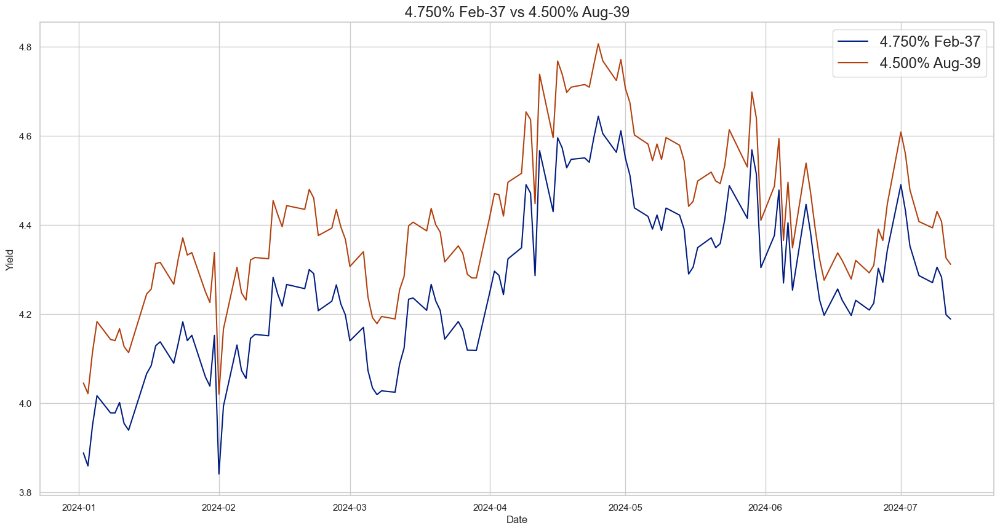

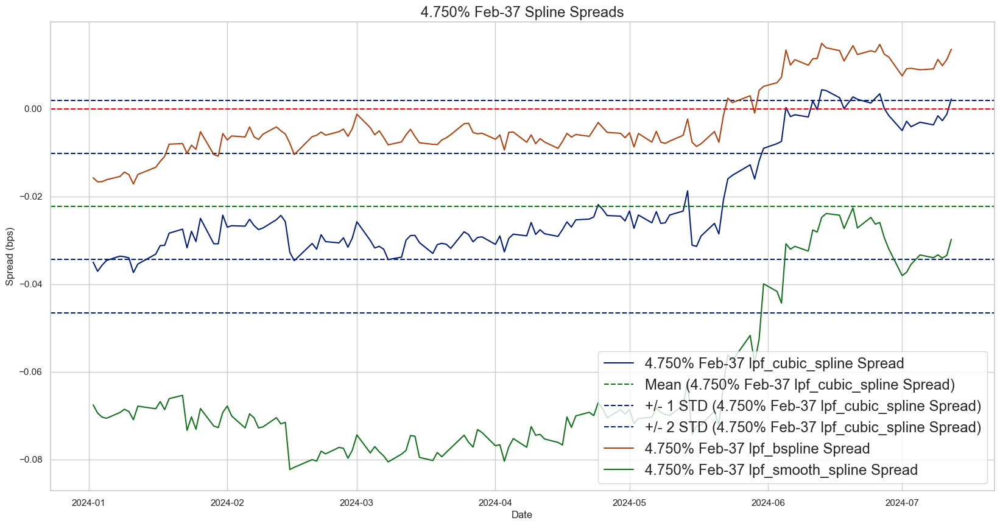

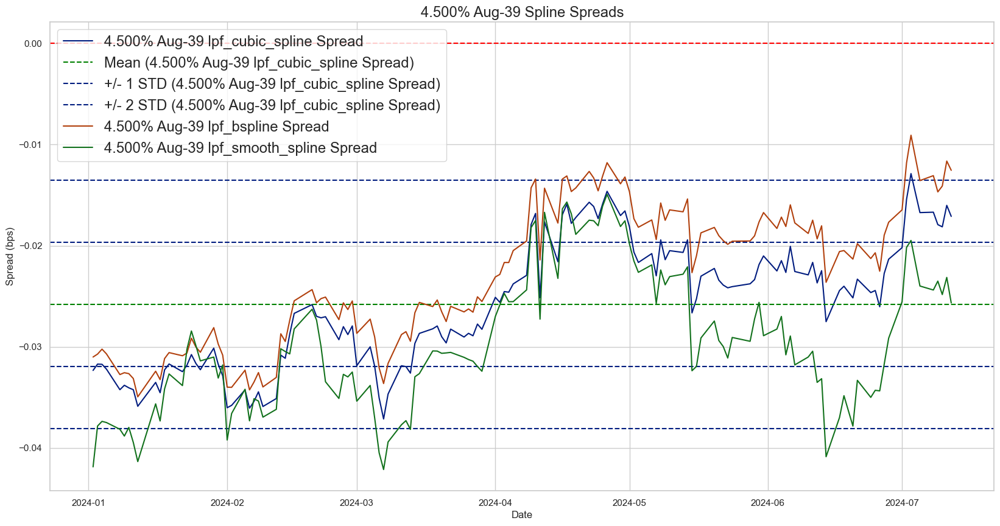

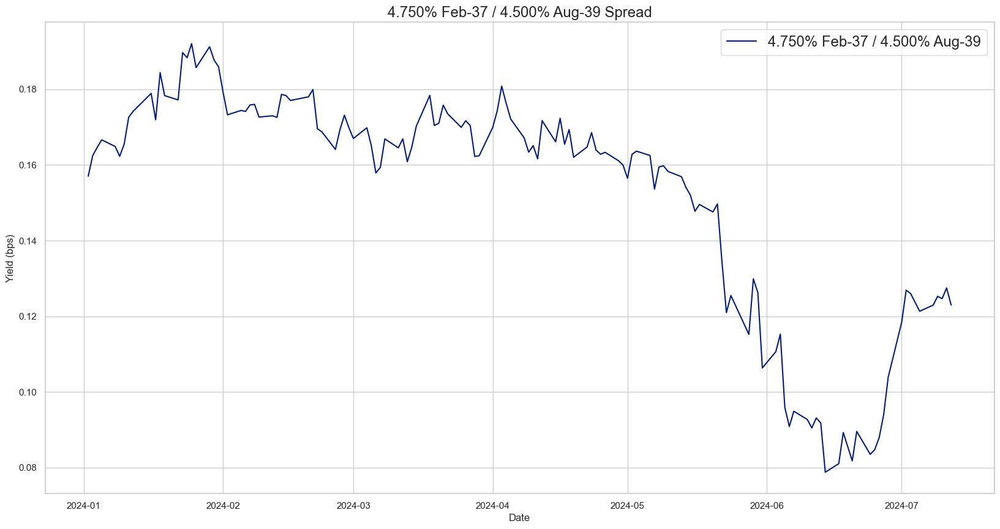

lpf_cubic_spline is Benchmark Spline


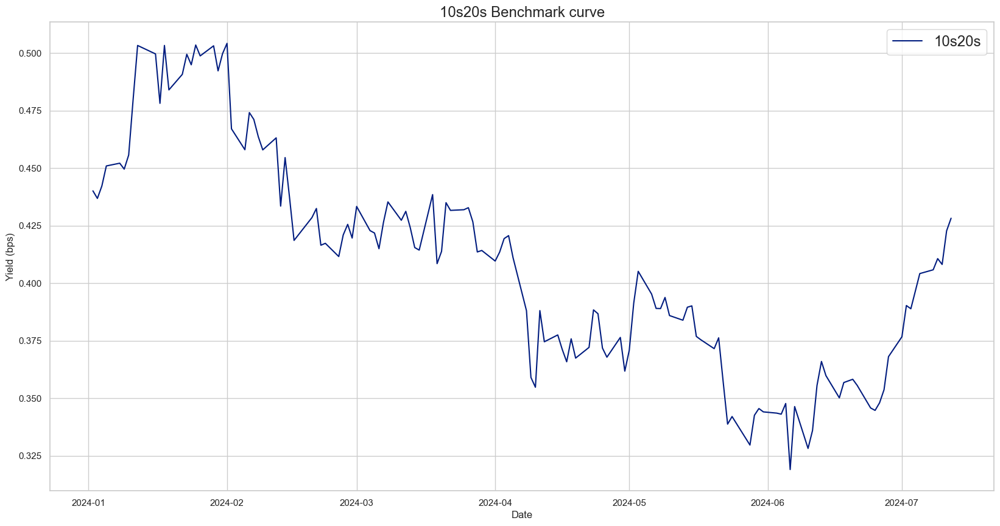

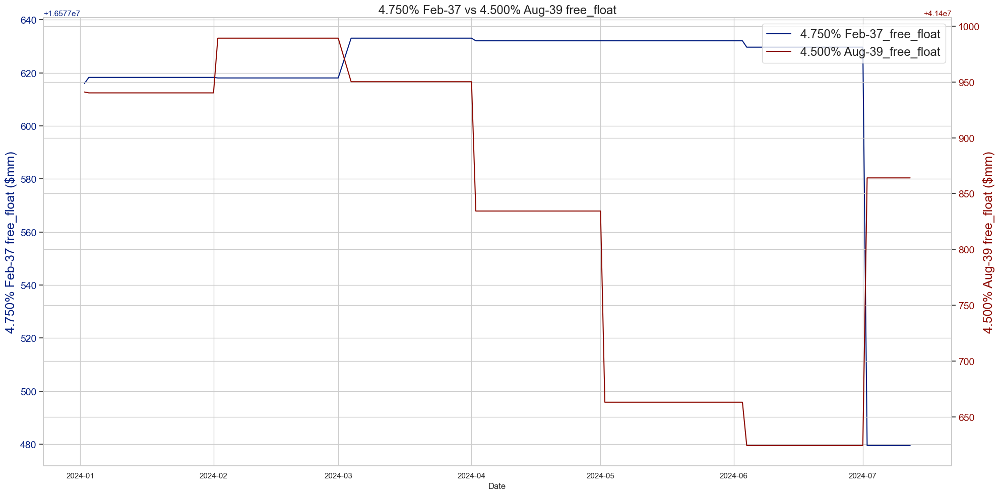

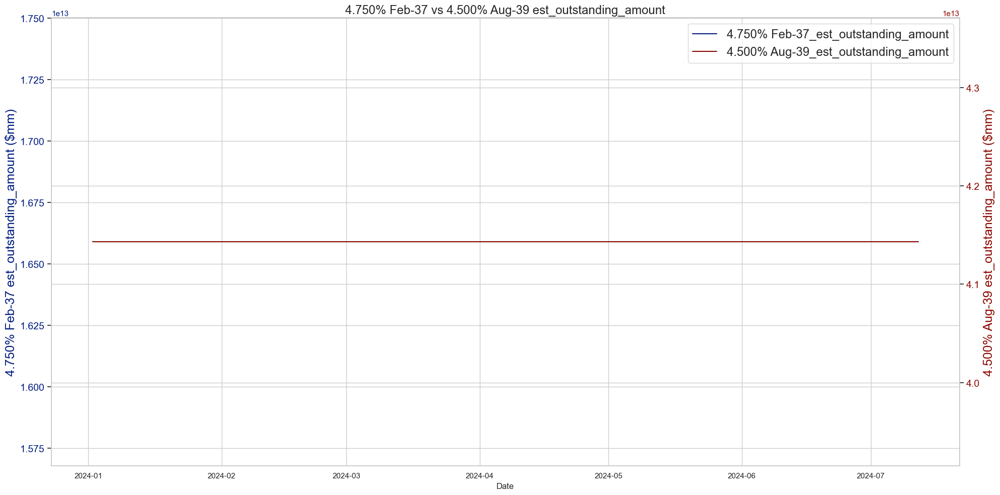

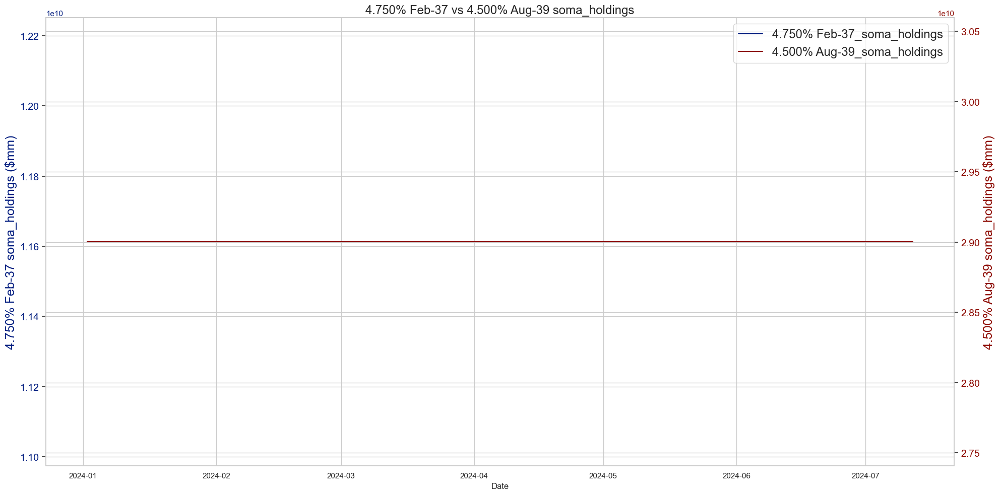

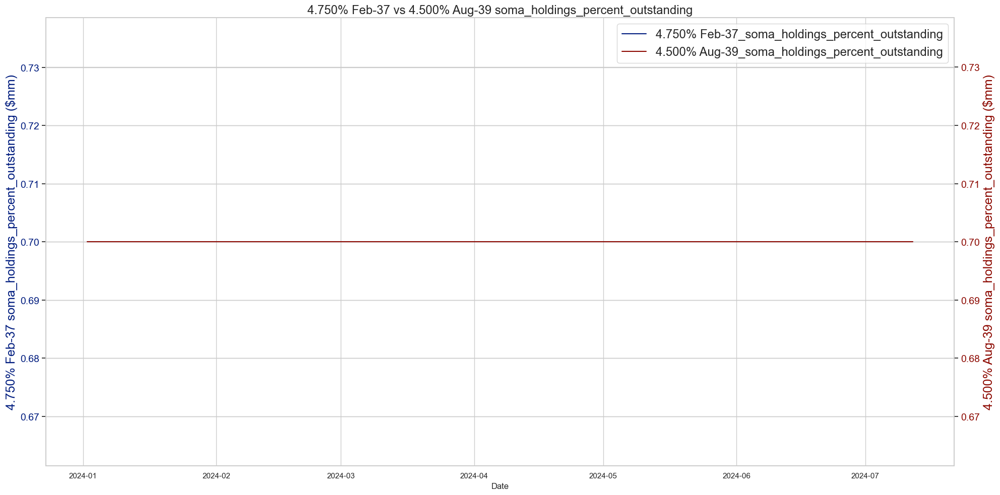

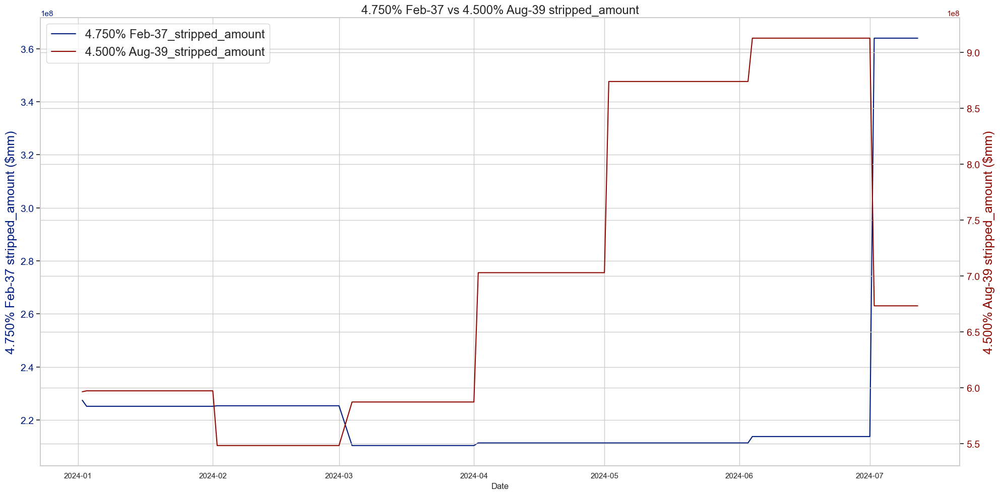

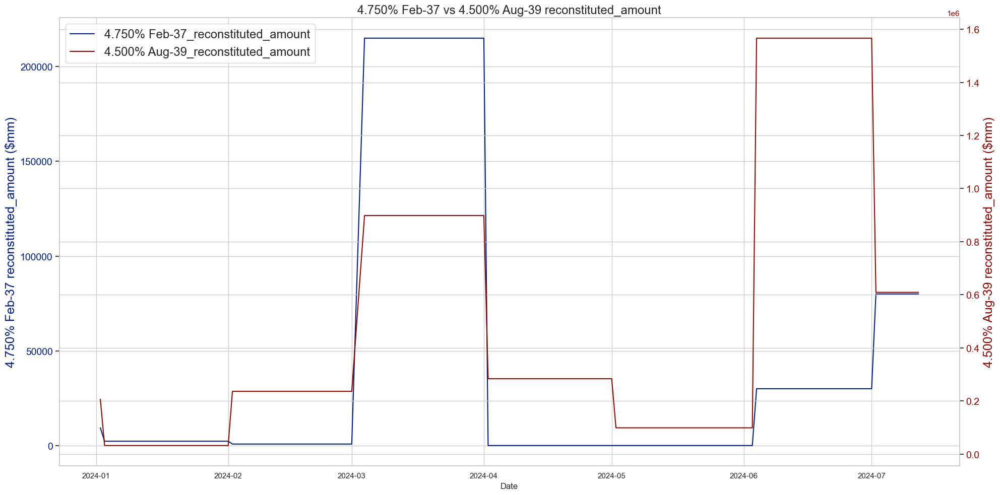

                                  OLS Regression Results                                 
Dep. Variable:     4.750% Feb-37 / 4.500% Aug-39   R-squared:                       0.536
Model:                                       OLS   Adj. R-squared:                  0.533
Method:                            Least Squares   F-statistic:                     152.5
Date:                           Sun, 06 Oct 2024   Prob (F-statistic):           9.17e-24
Time:                                   20:04:50   Log-Likelihood:                 331.39
No. Observations:                            134   AIC:                            -658.8
Df Residuals:                                132   BIC:                            -653.0
Df Model:                                      1                                         
Covariance Type:                       nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
--------

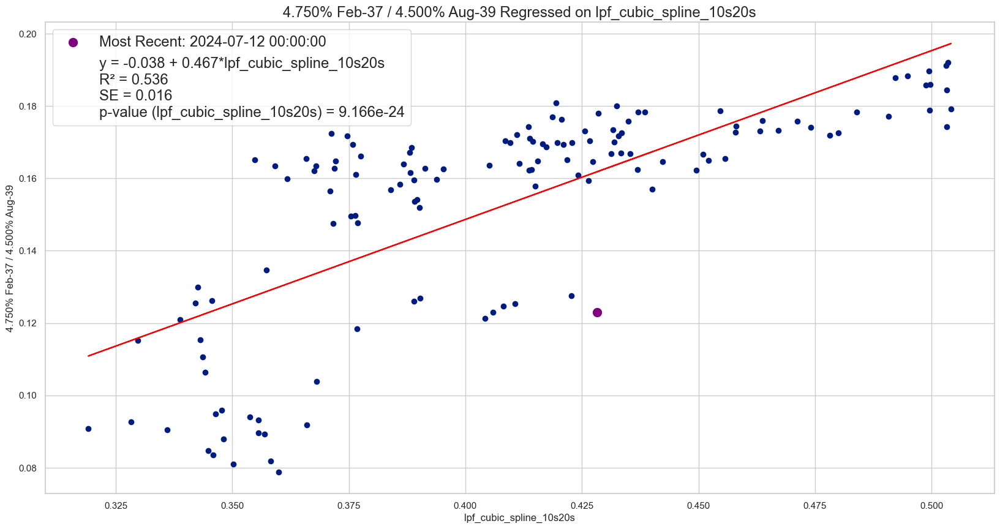

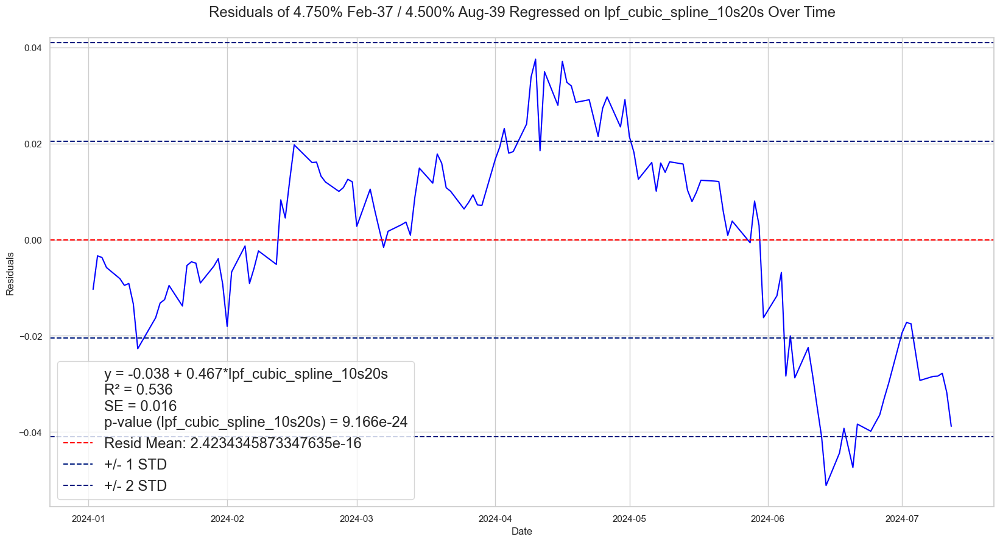

                                  OLS Regression Results                                 
Dep. Variable:     4.750% Feb-37 / 4.500% Aug-39   R-squared:                       0.207
Model:                                       OLS   Adj. R-squared:                  0.201
Method:                            Least Squares   F-statistic:                     34.56
Date:                           Sun, 06 Oct 2024   Prob (F-statistic):           3.20e-08
Time:                                   20:04:51   Log-Likelihood:                 295.52
No. Observations:                            134   AIC:                            -587.0
Df Residuals:                                132   BIC:                            -581.3
Df Model:                                      1                                         
Covariance Type:                       nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------

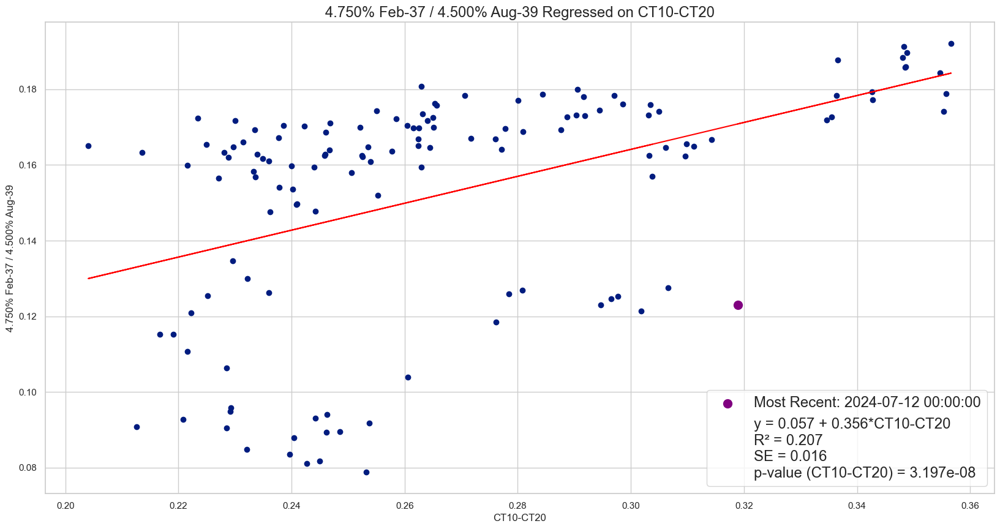

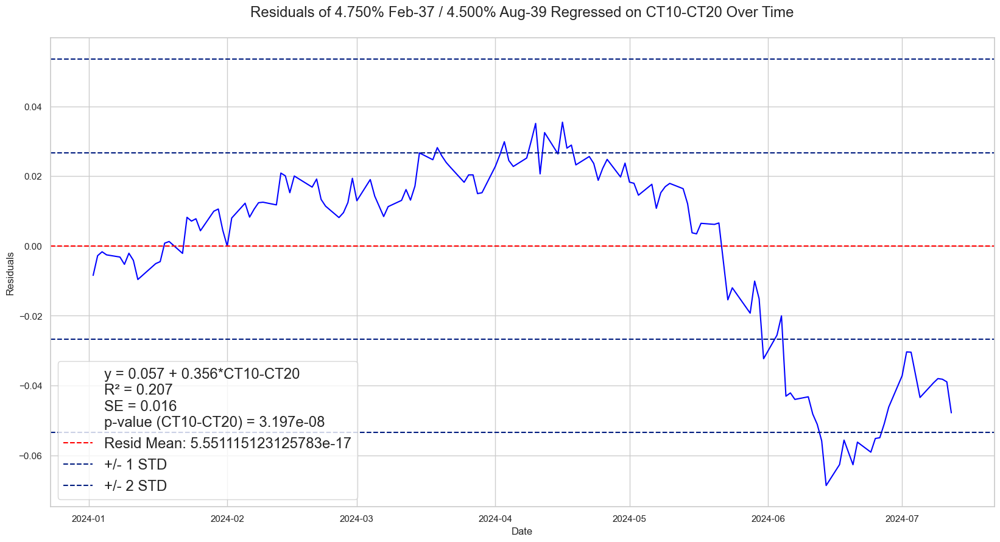

Using lpf_cubic_spline for UST Metrics Calcs


4.750% Feb-37 Metrics Calc: 134it [00:04, 30.85it/s]
4.500% Aug-39 Metrics Calc: 134it [00:03, 36.47it/s]


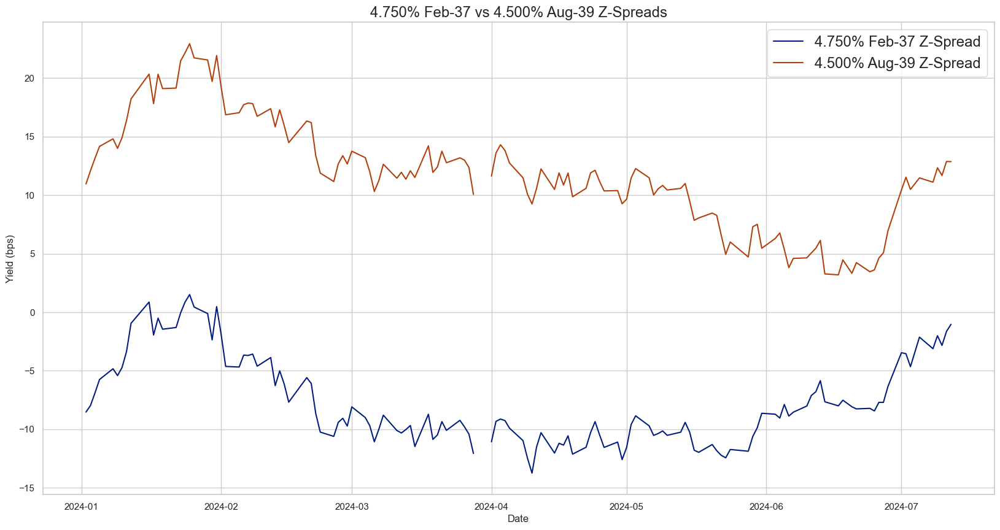

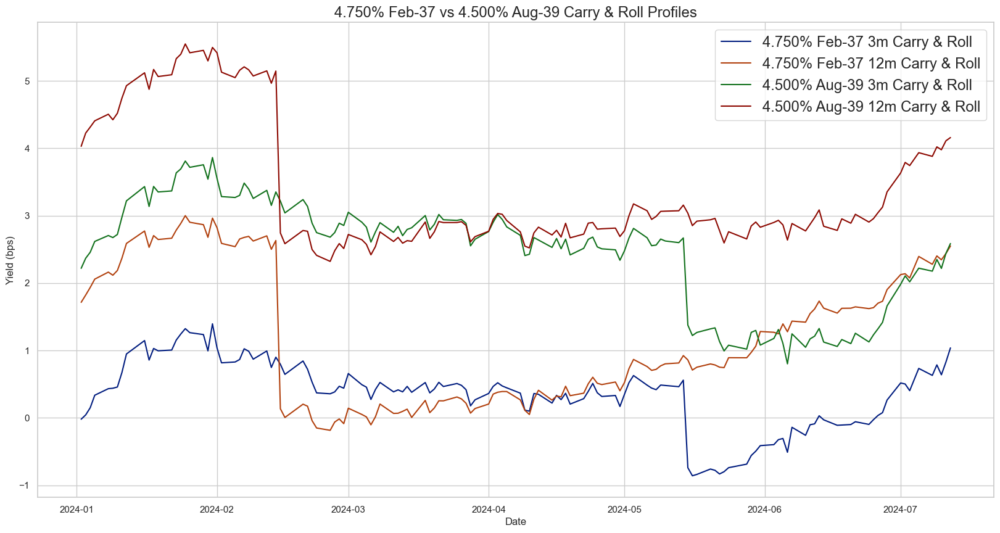

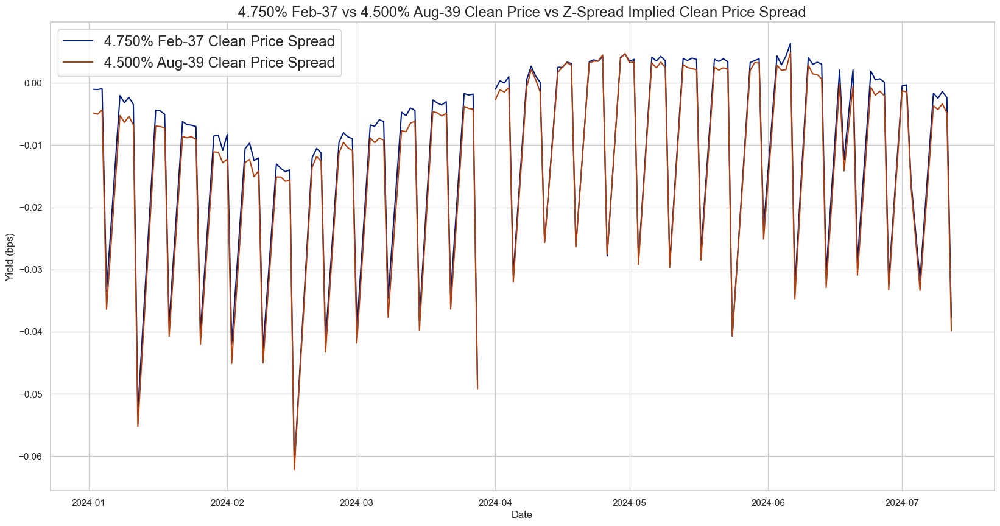

In [114]:
label1 = "4.750% Feb-37" 
label2 = "4.500% Aug-39" 

cusip_spread_rv_regression(
    curve_data_fetcher=curve_data_fetcher,
    label1=label1,
    label2=label2,
    cusip_timeseries=cusip_timeseries,
    fitted_splines_timeseries_dict={
        "lpf_cubic_spline": fitted_cubic_spline_timeseries,
        "lpf_bspline": fitted_bspline_timeseries,
        "lpf_smooth_spline": fitted_smooth_spline_timeseries,
    },
    benchmark_tenor_1=10,
    benchmark_tenor_2=20,
    ct_yields_df=ct_yields_df,
    date_subset=(datetime(2024, 1, 1), datetime(2024, 7, 12))
)

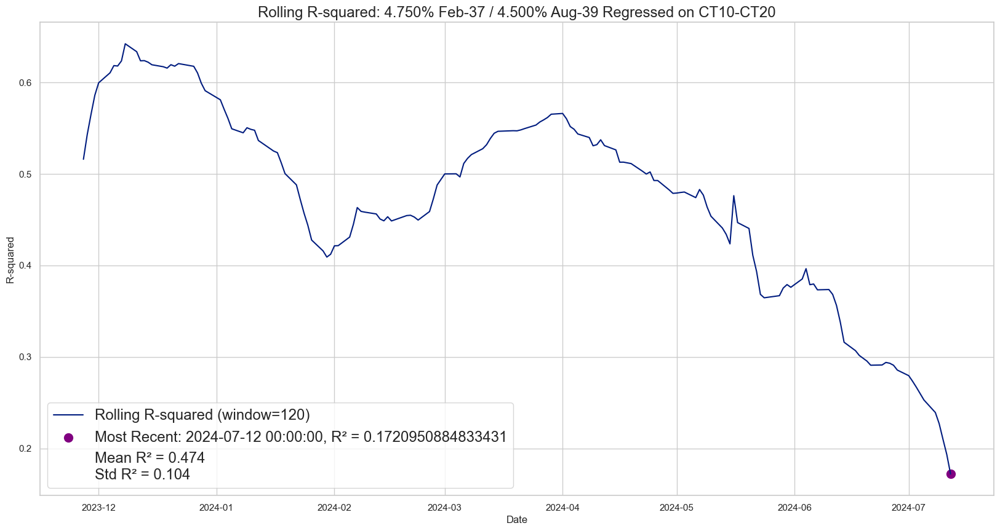

In [119]:
benchmark_tenor_1 = 10
benchmark_tenor_2 = 20

cusip1 = curve_data_fetcher.ust_data_fetcher.ust_label_to_cusip(label1)["cusip"]
cusip2 = curve_data_fetcher.ust_data_fetcher.ust_label_to_cusip(label2)["cusip"]
cusip1_df = pd.DataFrame(cusip_timeseries[cusip1]).sort_values(by=["Date"])
cusip2_df = pd.DataFrame(cusip_timeseries[cusip2]).sort_values(by=["Date"])
spread_df = pd.DataFrame({"Date": cusip1_df["Date"], f"{label1} / {label2}": cusip2_df["eod_yield"] - cusip1_df["eod_yield"]})
ct_yields_df[f"CT{benchmark_tenor_1}-CT{benchmark_tenor_2}"] = ct_yields_df[f"CT{benchmark_tenor_2}"] - ct_yields_df[f"CT{benchmark_tenor_1}"]
spread_df = pd.merge(left=spread_df[["Date", f"{label1} / {label2}"]], right=ct_yields_df, on="Date", how="inner")

rolling_r2 = run_rolling_regression_df(
    df=spread_df,
    x_col=f"CT{benchmark_tenor_1}-CT{benchmark_tenor_2}",
    y_col=f"{label1} / {label2}",
    window=120
)